# Credit Card Clients
---
## Introduction

This is a study based on the credit card data from clients in Taiwan, during 2006, available in the [UCI Machine Learning Repository page](https://archive.ics.uci.edu/dataset/350/default+of+credit+card+clients). Back then, Taiwan suffered with cash and credit card crisis, so in order to reduce risk and increase market share, the finantial institutions had to analyze the clients' data, as their credit card limit, their previous payments, age and education, for example. This analysis what I'm about to do as well, as you can see below: 

---
## Importing the libraries

In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.express as px
import numpy as np
from sklearn.decomposition import PCA

---
## Loading databases, and data visualization 

In [2]:
card_data = pd.read_csv('credit_card_clients.csv', header = 1)
card_data

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


---
## Clustering with 2 columns
---
### Data preprocessing

As there's no column with the total bill, I'll create it: 

In [3]:
card_data['BILL_TOTAL'] = card_data['BILL_AMT1'] + card_data['BILL_AMT2'] + card_data['BILL_AMT3'] + card_data['BILL_AMT4'] + card_data['BILL_AMT5'] + card_data['BILL_AMT6']

In [4]:
X_card = card_data.iloc[:, [1, 25]].values
X_card

array([[ 20000,   7704],
       [120000,  17077],
       [ 90000, 101653],
       ...,
       [ 30000,  70496],
       [ 80000, 266611],
       [ 50000, 230874]], dtype=int64)

I'm calling 'X_card' the array with the clients' limit and the total bill.

In [5]:
scaler_card = StandardScaler()
X_card = scaler_card.fit_transform(X_card)

Scalling the data, so the model can work properly.

In [6]:
X_card

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

---
### K Means Modeling

First, I need to find out the number of clusters. I'm using the WCSS (Within-Cluster Sum of Squares) method, which measures the total variance within each cluster by summing the squared distances between each data point and the centroid of its cluster. I'll start plotting the WCSS against the number of clusters, from 1 to 10: 

The goal is to minimize this variance, as smaller WCSS values indicate more compact clusters. Typically, I use the "elbow method" to analyze how WCSS changes as the number of clusters increases. By plotting WCSS against the number of clusters, I look for the "elbow point," where the decrease in WCSS starts to slow down significantly. This point suggests a balance between minimizing WCSS and avoiding overfitting with too many clusters.

In [7]:
wcss = []
for i in range(1, 11):
  kmeans_card = KMeans(n_clusters=i, n_init=10, random_state=0)
  kmeans_card.fit(X_card)
  wcss.append(kmeans_card.inertia_)

In [8]:
wcss

[60000.00000000003,
 35196.57080583446,
 20128.132558347672,
 14943.809173865959,
 10707.537016753664,
 8603.395384848947,
 7400.069599689455,
 6353.473303353446,
 5665.82385774019,
 5052.188166408731]

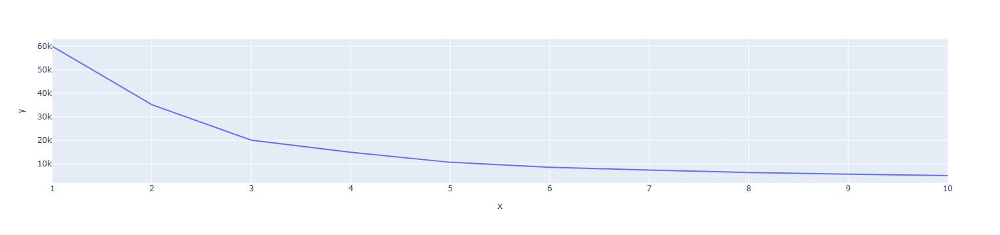

In [9]:
fig = px.line(x=range(1, 11), y=wcss)
fig.show()

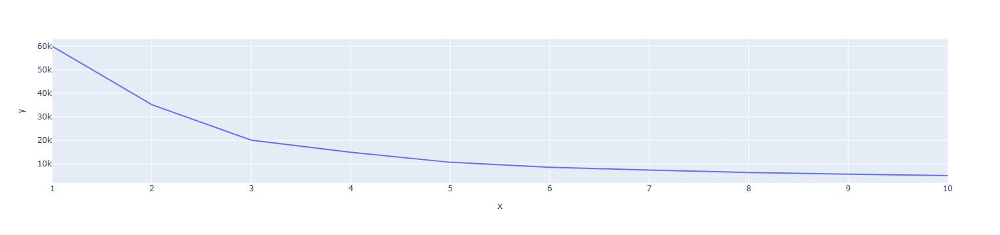

In [9]:
graph = px.line(x = range(1,11), y = wcss)
graph.show()

Analysing the graph above, the elbow point seems to be 4. I'll consider 4 clusters then: 

In [10]:
kmeans_card = KMeans(n_clusters=4, n_init=10, random_state=0)
labels = kmeans_card.fit_predict(X_card)

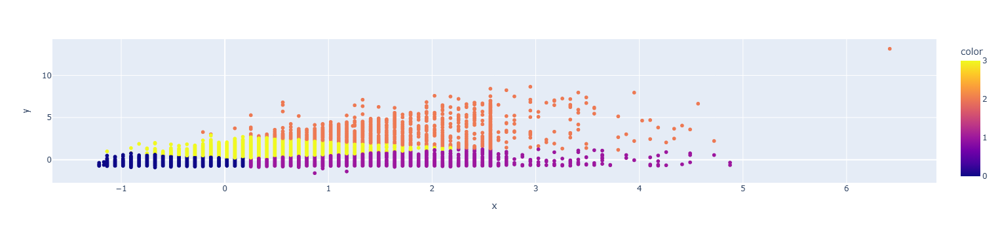

In [11]:
graph = px.scatter(x = X_card[:,0], y = X_card[:,1], color=labels)
graph.show()

From the graph above, we can see the 4 clusters, and it's possible to understand that: 
- The orange cluster has the highest limits and bills. I would recommend increasing their limit as they appear to be high-value customers. 
- In general, the yellow cluster doesn't use much of their available limit. 
- The purple cluster uses a lot of their limit. While increasing their limit could be a good opportunity, it is crucial to analyze their payment history to understand whether there are underlying reasons for their current limit.
- The blue cluster is riskier, as they have the lowest credit limits but utilize most of it. If the bank is willing to take on some risk, I’d recommend analyzing their payment behavior in detail before making any changes.

According to the analysis above, this is the client list, ordered by cluster:

In [12]:
clients_list = np.column_stack((card_data, labels))
clients_list

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [     2, 120000,      2, ...,      1,  17077,      0],
       [     3,  90000,      2, ...,      0, 101653,      0],
       ...,
       [ 29998,  30000,      1, ...,      1,  70496,      0],
       [ 29999,  80000,      1, ...,      1, 266611,      0],
       [ 30000,  50000,      1, ...,      1, 230874,      0]], dtype=int64)

In [13]:
clients_list = clients_list[clients_list[:,26].argsort()]
clients_list

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [ 16789,  30000,      1, ...,      1,  14274,      0],
       [ 16788,  30000,      1, ...,      1,  90453,      0],
       ...,
       [ 20882, 110000,      1, ...,      0, 554308,      3],
       [ 20744, 220000,      1, ...,      0, 452961,      3],
       [ 20270, 150000,      2, ...,      0, 546939,      3]], dtype=int64)

---
## Clustering with more columns
---
### Data preprocessing

In [14]:
card_data.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month', 'BILL_TOTAL'],
      dtype='object')

In [15]:
X_card_plus = card_data.iloc[:,[1,3,4,5,25]].values
X_card_plus

array([[ 20000,      2,      1,     24,   7704],
       [120000,      2,      2,     26,  17077],
       [ 90000,      2,      2,     34, 101653],
       ...,
       [ 30000,      2,      2,     37,  70496],
       [ 80000,      3,      1,     41, 266611],
       [ 50000,      2,      1,     46, 230874]], dtype=int64)

Instead of using just the clients' limit and their total bills, I'm also using their education, marriage situation and age.

In [16]:
scaler_card_plus = StandardScaler()
X_card_plus = scaler_card.fit_transform(X_card_plus)

In [17]:
X_card_plus

array([[-1.13672015,  0.18582826, -1.05729503, -1.24601985, -0.69069198],
       [-0.3659805 ,  0.18582826,  0.85855728, -1.02904717, -0.66599747],
       [-0.59720239,  0.18582826,  0.85855728, -0.16115646, -0.44316987],
       ...,
       [-1.05964618,  0.18582826,  0.85855728,  0.16430256, -0.52525745],
       [-0.67427636,  1.45111372, -1.05729503,  0.59824792, -0.00856436],
       [-0.90549825,  0.18582826, -1.05729503,  1.14067961, -0.10271861]])

---
### K Means Modeling

In [18]:
wcss = []
for i in range(1, 11):
  kmeans_card_plus = KMeans(n_clusters = i, n_init=10, random_state = 0)
  kmeans_card_plus.fit(X_card_plus)
  wcss.append(kmeans_card_plus.inertia_)

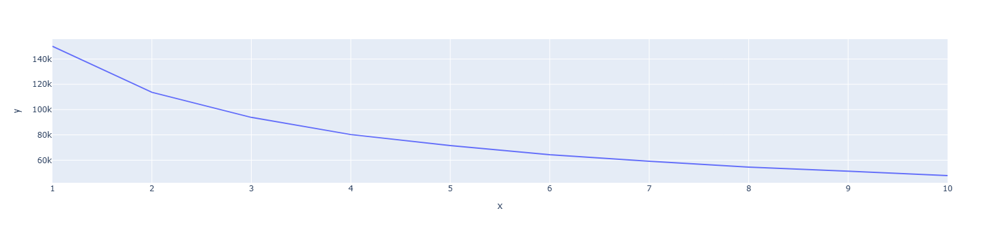

In [19]:
graph = px.line(x = range(1,11), y = wcss)
graph.show()

The elbow point seems to be 4 again, even with more columns.

In [20]:
kmeans_card_plus = KMeans(n_clusters=4, n_init=10, random_state=0)
labels = kmeans_card_plus.fit_predict(X_card_plus)

In [21]:
labels

array([0, 2, 2, ..., 2, 0, 0])

As this time I'm using more than two columns, plotting the values and clusters won't be possible, without using some method to simplify them. To do so, I'm using the PCA (Principal Component Analysis) method, that reduces the dimensionality of the dataset by transforming the original features into a smaller set of uncorrelated components, which capture the maximum variance in the data.

In [22]:
pca = PCA(n_components=2)
X_card_plus_pca = pca.fit_transform(X_card_plus)

In [23]:
X_card_plus_pca.shape

(30000, 2)

In [24]:
X_card_plus_pca

array([[-0.68636048, -1.14798291],
       [-1.43188404, -0.30903847],
       [-0.90262988, -0.49465725],
       ...,
       [-0.87805824, -0.88092842],
       [ 1.10158908, -1.53427205],
       [ 1.05818939, -1.12591183]])

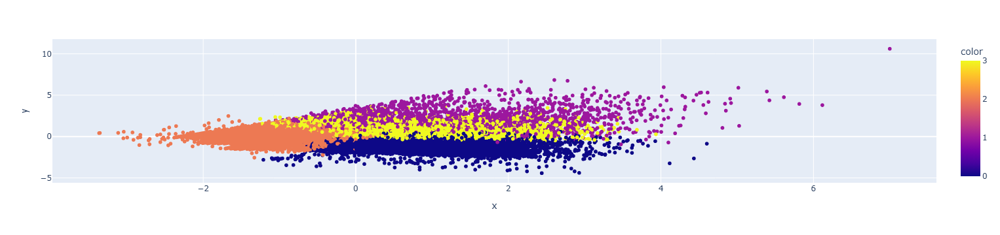

In [25]:
graph = px.scatter(x= X_card_plus_pca[:,0], y = X_card_plus_pca[:,1], color=labels)
graph.show()

As I used the PCA method, it's not possible to analyse the graph as I did before, when I ploted the bills and the limits. Still, it's possible to list the clients and their clusters: 

In [26]:
clients_list = np.column_stack((card_data, labels))
clients_list = clients_list[clients_list[:,26].argsort()]
clients_list

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [ 15240, 130000,      2, ...,      0, 741402,      0],
       [ 15241, 180000,      2, ...,      0,      0,      0],
       ...,
       [ 16349, 500000,      2, ...,      0,  83222,      3],
       [ 23200, 150000,      2, ...,      0,   9474,      3],
       [  1338, 290000,      2, ...,      0, 135708,      3]], dtype=int64)